#**Data visualization**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [ ]:
data_train=pd.read_csv('/content/pendigits-tra.csv')

In [ ]:
data_train.head()

,47,100,27,81,57,37,26,0,0.1,23,56,53,100.1,90,40,98,8
0,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
1,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
2,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
3,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
4,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6


In [ ]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7493 entries, 0 to 7492
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0    47     7493 non-null   int64
 1   100     7493 non-null   int64
 2    27     7493 non-null   int64
 3    81     7493 non-null   int64
 4    57     7493 non-null   int64
 5    37     7493 non-null   int64
 6    26     7493 non-null   int64
 7     0     7493 non-null   int64
 8     0.1   7493 non-null   int64
 9    23     7493 non-null   int64
 10   56     7493 non-null   int64
 11   53     7493 non-null   int64
 12  100.1   7493 non-null   int64
 13   90     7493 non-null   int64
 14   40     7493 non-null   int64
 15   98     7493 non-null   int64
 16   8      7493 non-null   int64
dtypes: int64(17)
memory usage: 995.3 KB


In [ ]:
data_test=pd.read_csv('/content/pendigits-tes.csv')

In [ ]:
data_test.head()

,88,92,2,99,16,66,94,37,70,0,0.1,24,42,65,100,100.1,8
0,80,100,18,98,60,66,100,29,42,0,0,23,42,61,56,98,8
1,0,94,9,57,20,19,7,0,20,36,70,68,100,100,18,92,8
2,95,82,71,100,27,77,77,73,100,80,93,42,56,13,0,0,9
3,68,100,6,88,47,75,87,82,85,56,100,29,75,6,0,0,9
4,70,100,100,97,70,81,45,65,30,49,20,33,0,16,0,0,1


In [ ]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3497 entries, 0 to 3496
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0    88     3497 non-null   int64
 1    92     3497 non-null   int64
 2     2     3497 non-null   int64
 3    99     3497 non-null   int64
 4    16     3497 non-null   int64
 5    66     3497 non-null   int64
 6    94     3497 non-null   int64
 7    37     3497 non-null   int64
 8    70     3497 non-null   int64
 9     0     3497 non-null   int64
 10    0.1   3497 non-null   int64
 11   24     3497 non-null   int64
 12   42     3497 non-null   int64
 13   65     3497 non-null   int64
 14  100     3497 non-null   int64
 15  100.1   3497 non-null   int64
 16   8      3497 non-null   int64
dtypes: int64(17)
memory usage: 464.6 KB


 **1- Generate a scatterplot matrix to show the relationships between the variables and a
heatmap to determine correlated**

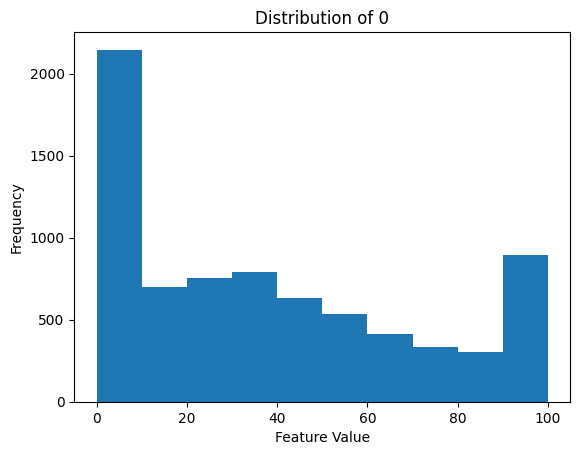

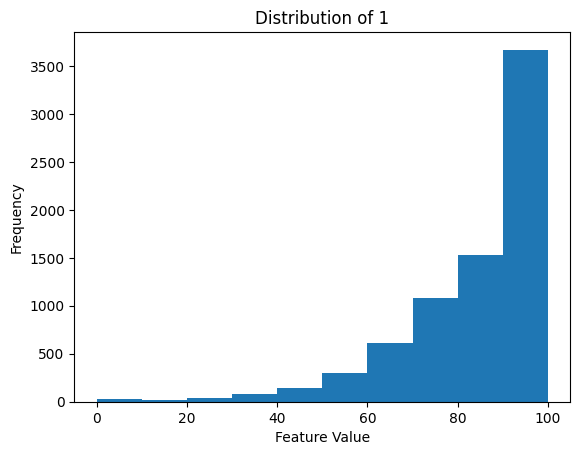

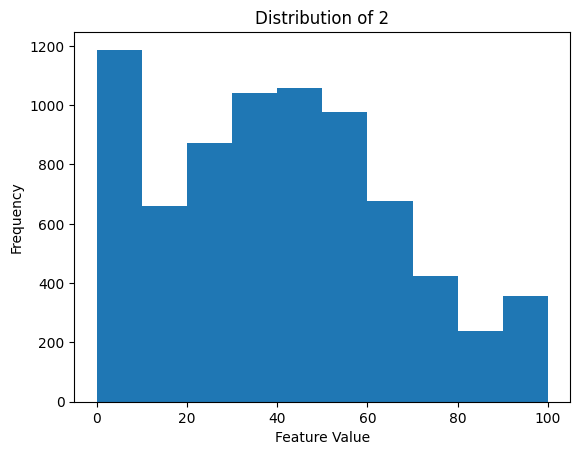

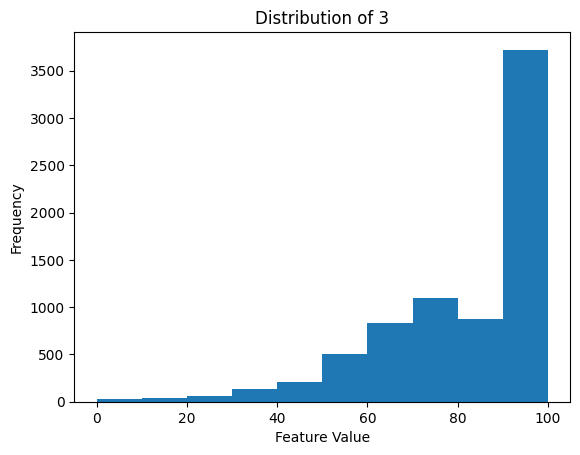

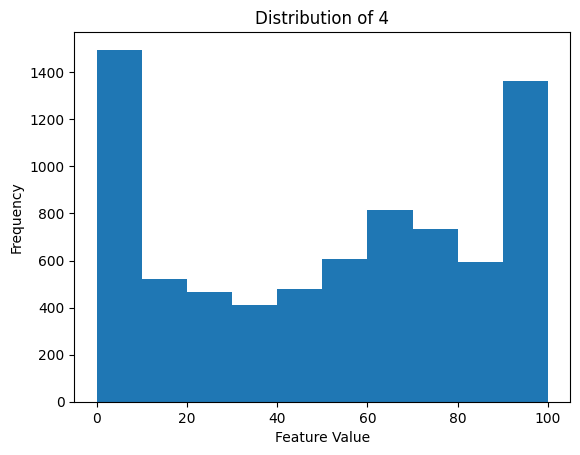

...

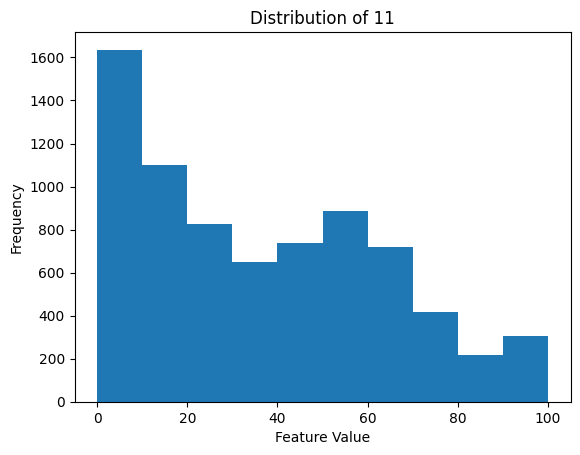

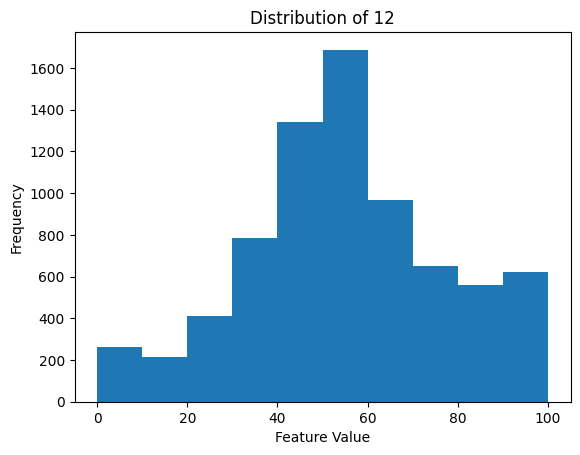

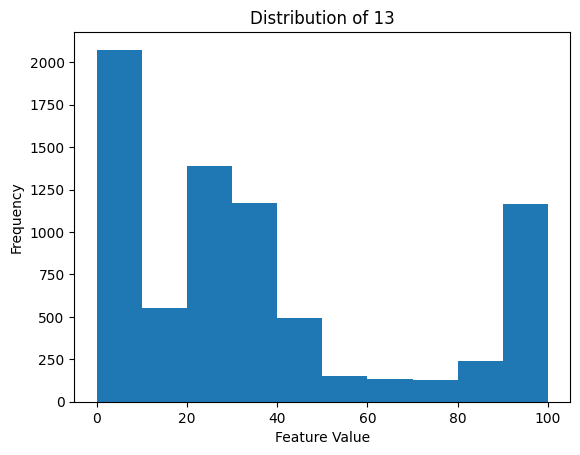

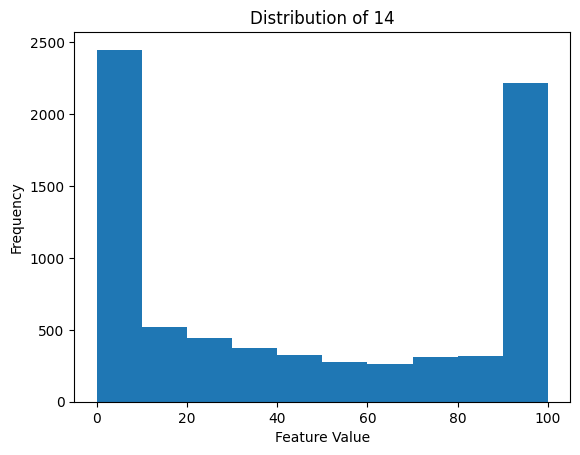

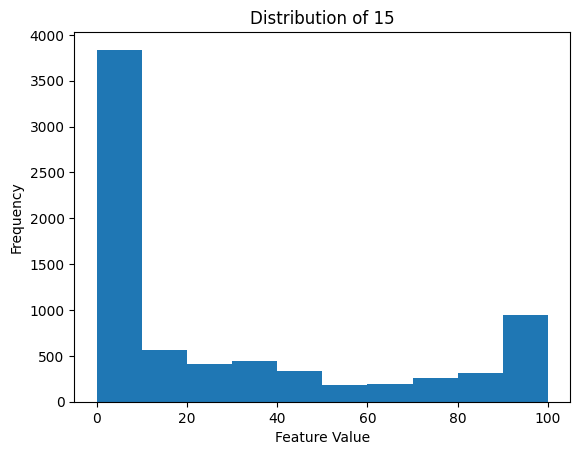

In [ ]:
for col in X_train.columns:
  plt.hist(X_train[col])
  plt.xlabel('Feature Value')
  plt.ylabel('Frequency')
  plt.title(f'Distribution of {col}')
  plt.show()

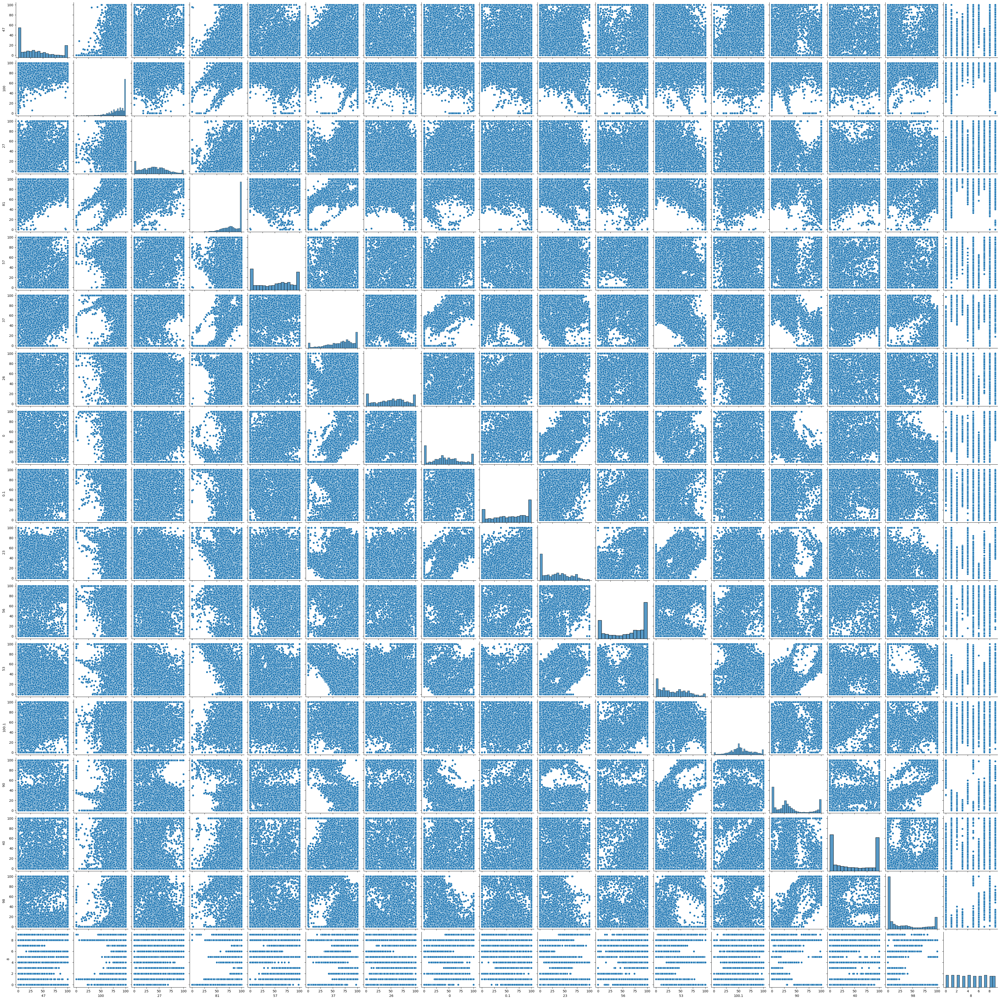

In [ ]:
sns.pairplot(data_train)

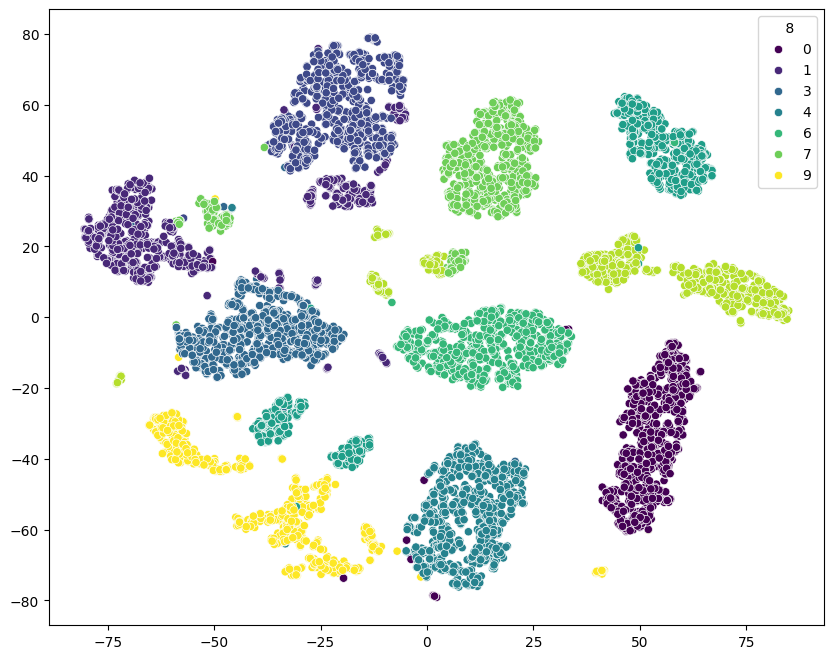

In [ ]:
from sklearn.manifold import TSNE

# Assuming 'data' is your DataFrame and 'digit' is the column for labels
X = data_train.drop(data_train.columns[16], axis=1)
y = data_train[data_train.columns[16]]

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_embedded = tsne.fit_transform(X)

# Visualize the embedded data
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_embedded[:, 0], y=X_embedded[:, 1], hue=y,palette='viridis')
plt.show()

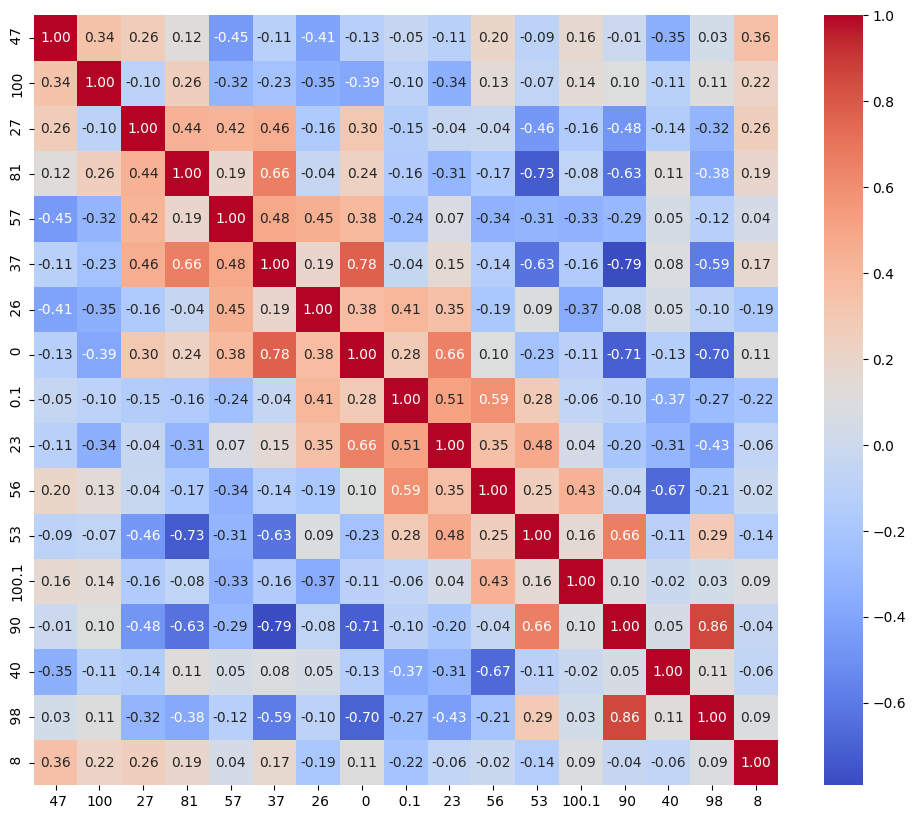

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(data_train.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

 **-noticed the distribution of individual features. The diagonal of the pairplot shows the distribution of each feature
 -there are noticed both strong positive and negative correlation**

*  **2- Ensure data is in the correct format for downstream processes (e.g., remove redundant
information, convert categorical to numerical values, address missing values, etc.)**

In [ ]:
data_train.isnull().sum()
# data is ensured

,0
47,0
100,0
27,0
81,0
57,0
37,0
26,0
0,0
0.1,0
23,0


**# Decision tree**

**3- Fit a decision tree to the training data. Plot the tree, interpret the results, and display
accuracy and Confusion Matrix.**

In [ ]:
X_train = data_train.iloc[:, :-1]
y_train = data_train.iloc[:, -1]
X_test = data_test.iloc[:, :-1]
y_test = data_test.iloc[:, -1]
X_train.columns = range(X_train.shape[1])
X_test.columns = range(X_test.shape[1])

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_train_scale = scaler.fit_transform(X_train)
x_test_scale =scaler.transform(X_test)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.tree import plot_tree
model_1 = DecisionTreeClassifier()

In [ ]:
model_1.fit(x_train_scale, y_train)

DecisionTreeClassifier()

In [ ]:
y_pred = model_1.predict(x_test_scale)

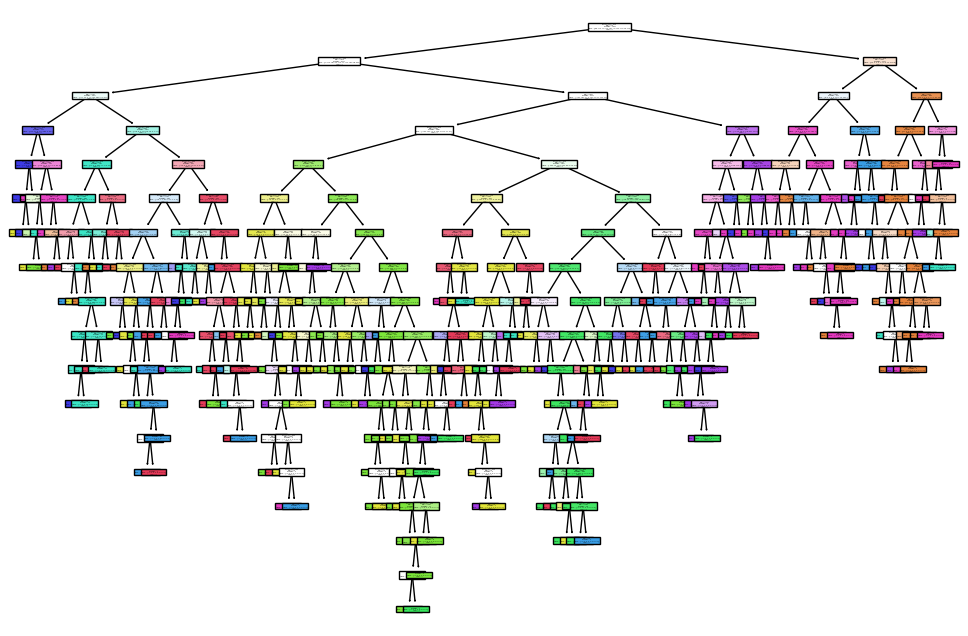

In [ ]:
# Plot the decision tree
plt.figure(figsize=(12, 8))
# Convert class values to strings for class_names
class_names = [str(i) for i in range(len(model_1.classes_))]
feature_names = [f'Feature {i}' for i in range(X_train.shape[1])]
plot_tree(model_1, filled=True, feature_names=feature_names, class_names=class_names)
plt.show()

In [ ]:
# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9213611667143266


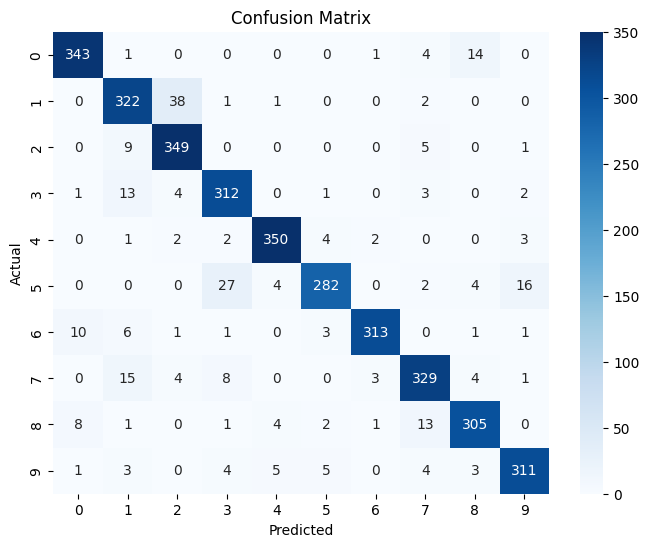

In [ ]:
cm = confusion_matrix(y_test, y_pred)

# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

**4- Try different ways to improve the decision tree algorithm (e.g., use different splitting
strategies, prune tree after splitting).**

In [ ]:
# Gini impurity
clf_gini = DecisionTreeClassifier(criterion='gini')

In [ ]:
clf_gini.fit(x_train_scale, y_train)
y_pred_gini = clf_gini.predict(x_test_scale)

In [ ]:
# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred_gini)
print("Accuracy:", accuracy)

Accuracy: 0.9142121818701744


In [ ]:
# Example using other pruning parameters
clf_pruned = DecisionTreeClassifier(criterion='entropy',max_depth=10, min_samples_split=5, min_samples_leaf=2)

In [ ]:
clf_pruned.fit(x_train_scale, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=5)

In [ ]:
y_pred_pruned = clf_pruned.predict(x_test_scale)

In [ ]:
# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred_pruned)
print("Accuracy:", accuracy)

Accuracy: 0.915927938232771


**# Bagging**

**1- Apply bagging strategy to classify test set samples by using SVM and Decision Tree
algorithm as base estimators. Display accuracy and Confusion Matrix.**

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# Create a BaggingClassifier with an SVM base estimator
svm_bagging = BaggingClassifier(base_estimator=SVC(), n_estimators=10, random_state=42)

In [ ]:
svm_bagging.fit(x_train_scale, y_train)
svm_y_pred = svm_bagging.predict(x_test_scale)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


In [ ]:
# Calculate and print accuracy
accuracy = accuracy_score(y_test, svm_y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9802688018301401


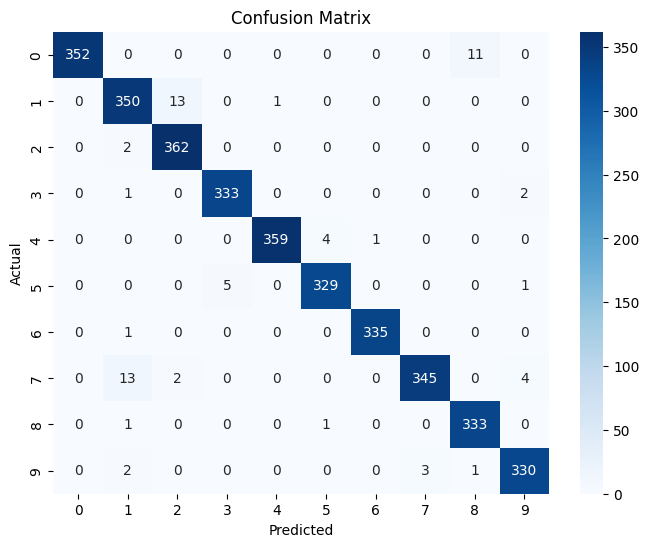

In [ ]:
cm = confusion_matrix(y_test, svm_y_pred)

# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Create a BaggingClassifier with a Decision Tree base estimator
dectree_bagging = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=10, random_state=42)

In [ ]:
dectree_bagging.fit(x_train_scale, y_train)
dectree_y_pred = dectree_bagging.predict(x_test_scale)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


In [ ]:
# Calculate and print accuracy
accuracy = accuracy_score(y_test, svm_y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9802688018301401


**2- Apply Random Forest algorithm (the baseline), then fine tune this baseline. For the
number of estimators, Try 5 different values within the interval of [10, 200]. Plot
accuracy vs. number of estimators.**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Create a Random Forest classifier (baseline)
rf_clf = RandomForestClassifier(random_state=42)

In [ ]:
rf_clf.fit(x_train_scale, y_train)
y_pred_baseline = rf_clf.predict(x_test_scale)

In [ ]:
# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred_baseline)
print("Accuracy:", accuracy)

Accuracy: 0.966542750929368


In [ ]:
# Fine-tune the number of estimators
param_grid_rf = {
    'n_estimators': [10, 50, 100, 150, 200]
}

In [ ]:
grid_search_rf = GridSearchCV(estimator=rf_clf, param_grid=param_grid_rf, cv=5, scoring='accuracy')

In [ ]:
grid_search_rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'n_estimators': [10, 50, 100, 150, 200]},
             scoring='accuracy')

In [ ]:
# Get the best number of estimators
best_n_estimators_rf = grid_search_rf.best_params_['n_estimators']

In [ ]:
best_n_estimators_rf

200

In [ ]:
# Get the best estimator
best_rf_clf =RandomForestClassifier(n_estimators=200)

In [ ]:
best_rf_clf.fit(x_train_scale, y_train)

RandomForestClassifier(n_estimators=200)

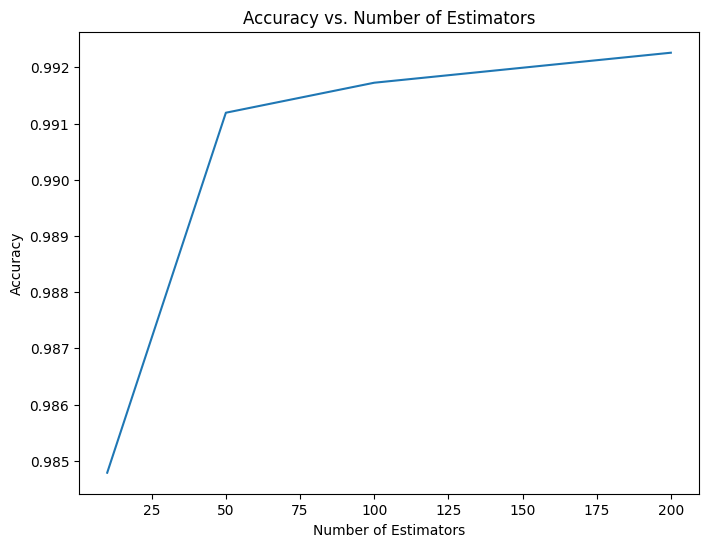

In [ ]:
# Plot accuracy vs. number of estimators
plt.figure(figsize=(8, 6))
plt.plot(param_grid_rf['n_estimators'], grid_search_rf.cv_results_['mean_test_score'])
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Estimators')
plt.show()

In [ ]:
# Make predictions using the fine-tuned model
y_pred_tuned_rf = best_rf_clf.predict(x_test_scale)

In [ ]:
# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred_tuned_rf)
print("Accuracy:", accuracy)

Accuracy: 0.9645410351730054


**#Boosting**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

**1- Use GradientBoosting classifier to classify test set samples. There are 2 important
hyperparameters in GradientBoosting**

In [ ]:
# Define the parameter grid for the number of estimators
param_grid_n_estimators = {'n_estimators': [10, 50, 100, 200]}
# Define the parameter grid for the learning rate
param_grid_learning_rate = {'learning_rate': [0.1, 0.3, 0.6, 0.9]}

In [ ]:
# Create a GradientBoostingClassifier
gb_clf = GradientBoostingClassifier()

# Create a GridSearchCV object
grid_search_n_estimators = GridSearchCV(estimator=gb_clf, param_grid=param_grid_n_estimators, cv=5)

In [ ]:
# Fit the GridSearchCV object to the data
grid_search_n_estimators.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'n_estimators': [10, 50, 100, 200]})

In [ ]:
# Get the best number of estimators
best_n_estimators = grid_search_n_estimators.best_params_['n_estimators']

In [ ]:
best_n_estimators

200

In [ ]:
gb_clf_est = GradientBoostingClassifier(n_estimators=best_n_estimators)

In [ ]:
# Create a GridSearchCV object
grid_search_learning_rate = GridSearchCV(estimator=gb_clf_est, param_grid=param_grid_learning_rate, cv=5)

In [ ]:
# Fit the GridSearchCV object to the data
grid_search_learning_rate.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(n_estimators=200),
             param_grid={'learning_rate': [0.1, 0.3, 0.6, 0.9]})

In [ ]:
# Get the best learning rate
best_learning_rate = grid_search_learning_rate.best_params_['learning_rate']

In [ ]:
best_learning_rate

0.1

In [ ]:
# Create a GradientBoostingClassifier with the best hyperparameters
best_gb_clf = GradientBoostingClassifier(n_estimators=200, learning_rate=0.1)

In [ ]:
# Fit the classifier to the training data
best_gb_clf.fit(X_train, y_train)

GradientBoostingClassifier(n_estimators=200)

In [ ]:
# Make predictions on the test data
y_pred_boost = best_gb_clf.predict(X_test)

In [ ]:
# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred_boost)
print("Accuracy:", accuracy)

Accuracy: 0.9656848727480698


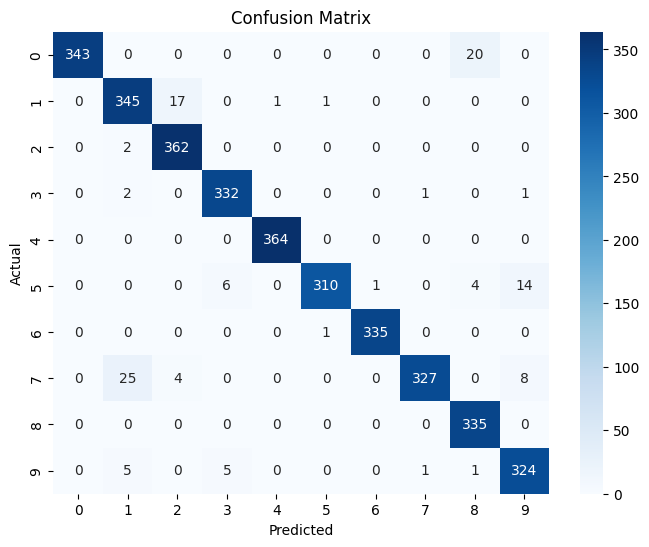

In [ ]:
cm = confusion_matrix(y_test, y_pred_boost)

# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

**2- Build XGBoost classifier with the same parameters that you obtained in the last one.
Provide accuracy and Confusion Matrix.**

In [ ]:
import xgboost as xgb
xgb_model = xgb.XGBClassifier(n_estimators=200, learning_rate=0.1)

In [ ]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
y_pred_xgb = xgb_model.predict(X_test)

In [ ]:
# Calculate and print the accuracy
accuracy = accuracy_score(y_test, y_pred_xgb)
print("Accuracy:", accuracy)

Accuracy: 0.9645410351730054


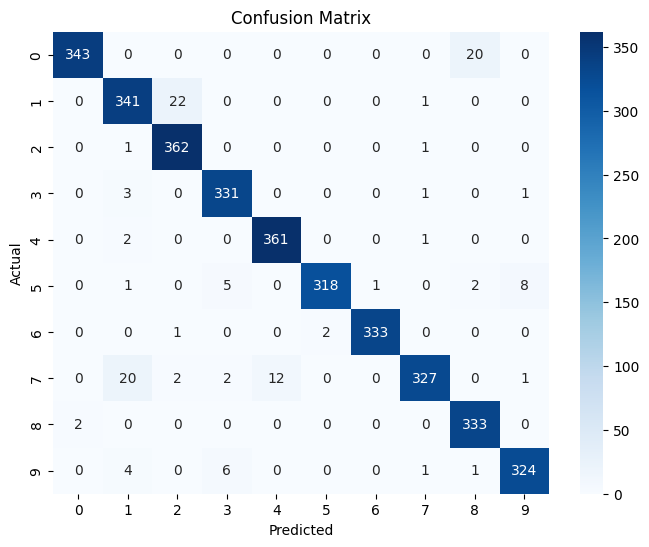

In [ ]:
cm = confusion_matrix(y_test, y_pred_xgb)

# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

**# Improving with PCA and Feature Selection:**

**1- Compare the performance of the models in terms of the following criteria: precision,
recall, accuracy, F-score. Identify the model that performed best and worst according to
each criterion.**

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Create a dictionary to store the results
results = {}

# Evaluate each model and store the results
models = {
    'Decision Tree': model_1,
    'Pruned Decision Tree': clf_pruned,
    'Gradient Boosting': best_gb_clf,
    'XGBoost': xgb_model,
    'SVM Bagging': svm_bagging,
    'Decision Tree Bagging': dectree_bagging,
    'Random Forest Baseline': rf_clf,
    'Random Forest Tuned': best_rf_clf
}

In [ ]:
for name, model in models.items():
    y_pred = model.predict(X_test)
    results[name] = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred, average='weighted'),
        'Recall': recall_score(y_test, y_pred, average='weighted'),
        'F1-score': f1_score(y_test, y_pred, average='weighted')
    }
results_df = pd.DataFrame(results).transpose()

print(results_df)

# Identify the best and worst models for each criterion
for metric in ['Accuracy', 'Precision', 'Recall', 'F1-score']:
    best_model = results_df[metric].idxmax()
    worst_model = results_df[metric].idxmin()
    print(f'\nBest {metric}: {best_model}')
    print(f'Worst {metric}: {worst_model}')

                        Accuracy  Precision    Recall  F1-score
Decision Tree           0.913640   0.916230  0.913640  0.914018
Pruned Decision Tree    0.918788   0.920376  0.918788  0.918830
Gradient Boosting       0.965685   0.967035  0.965685  0.965653
XGBoost                 0.964541   0.965500  0.964541  0.964479
SVM Bagging             0.980269   0.980576  0.980269  0.980285
Decision Tree Bagging   0.945382   0.948071  0.945382  0.945673
Random Forest Baseline  0.966829   0.967953  0.966829  0.966795
Random Forest Tuned     0.963111   0.964220  0.963111  0.963134

Best Accuracy: SVM Bagging
Worst Accuracy: Decision Tree

Best Precision: SVM Bagging
Worst Precision: Decision Tree

Best Recall: SVM Bagging
Worst Recall: Decision Tree

Best F1-score: SVM Bagging
Worst F1-score: Decision Tree


In [ ]:
# Svm bagging is best model
best_model_sofar = svm_bagging

In [ ]:
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest,chi2

**# PCA**

In [ ]:
pca=PCA(n_components=11)

In [ ]:
xtrain_new=pca.fit_transform(x_train_scale)
xtest_new=pca.transform(x_test_scale)

In [ ]:
pca.explained_variance_ratio_.sum()

0.9805032040918571

In [ ]:
best_model_sofar.fit(xtrain_new,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


BaggingClassifier(base_estimator=SVC(), random_state=42)

In [ ]:
y_pred_pca=best_model_sofar.predict(xtest_new)

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
print(classification_report(y_pred_pca,y_test))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99       353
           1       0.97      0.96      0.96       368
           2       1.00      0.97      0.99       373
           3       0.99      0.99      0.99       338
           4       0.98      1.00      0.99       359
           5       0.98      0.98      0.98       333
           6       1.00      0.99      1.00       337
           7       0.96      0.99      0.98       353
           8       0.99      0.97      0.98       344
           9       0.99      0.98      0.98       339

    accuracy                           0.98      3497
   macro avg       0.98      0.98      0.98      3497
weighted avg       0.98      0.98      0.98      3497



**# Chi Square**

In [ ]:
chi2_selector=SelectKBest(chi2,k=11)

In [ ]:
xtrain_selected=chi2_selector.fit_transform(x_train_scale,y_train)
xtest_selected=chi2_selector.transform(x_test_scale)

In [ ]:
best_model_sofar.fit(xtrain_selected,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


BaggingClassifier(base_estimator=SVC(), random_state=42)

In [ ]:
y_pred_chi2=best_model_sofar.predict(xtest_selected)

In [ ]:
print(classification_report(y_pred_chi2,y_test))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       353
           1       0.91      0.84      0.88       395
           2       0.99      0.92      0.95       389
           3       0.99      0.96      0.97       346
           4       0.98      0.99      0.99       360
           5       0.92      0.97      0.95       316
           6       1.00      1.00      1.00       336
           7       0.86      1.00      0.92       313
           8       0.99      0.96      0.98       347
           9       0.96      0.95      0.96       342

    accuracy                           0.96      3497
   macro avg       0.96      0.96      0.96      3497
weighted avg       0.96      0.96      0.96      3497



**# fisher score**

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [ ]:
lda=LinearDiscriminantAnalysis(n_components=9)

Xtrain_lda=lda.fit_transform(x_train_scale,y_train)
xtest_lda=lda.transform(x_test_scale)

In [ ]:
best_model_sofar.fit(Xtrain_lda,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


BaggingClassifier(base_estimator=SVC(), random_state=42)

In [ ]:
y_pred_lda=best_model_sofar.predict(xtest_lda)

In [ ]:
print(classification_report(y_pred_lda,y_test))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96       342
           1       0.84      0.86      0.85       357
           2       0.96      0.89      0.93       393
           3       0.99      0.97      0.98       342
           4       0.97      0.99      0.98       355
           5       0.96      0.92      0.94       351
           6       0.99      1.00      0.99       332
           7       0.87      0.98      0.92       321
           8       0.98      0.92      0.95       356
           9       0.96      0.93      0.94       348

    accuracy                           0.94      3497
   macro avg       0.94      0.94      0.94      3497
weighted avg       0.94      0.94      0.94      3497



**3- Evaluate how well the improved model does in precision, recall, accuracy, and F1-score.
This helps us see the impact of PCA and feature selection on its performance.**

**4- Compare the enhanced model's performance with its original version.**

In [ ]:
accuracy_original = accuracy_score(y_test, svm_y_pred)
print(f"Original model accuracy: {accuracy_original}")

Original model accuracy: 0.9802688018301401


In [ ]:
accuracy_original = accuracy_score(y_test, y_pred_pca)
print(f"enhanced model accuracy: {accuracy_original}")

enhanced model accuracy: 0.9828424363740349


**# A slighlty enhanced performance is realised**